# Exploratory Data Analysis for Machine Learning - Project

## Course 1 (IBM Machine Learning Professional Certificate)

This notebook is based on the structure/ideas which are part of the "Feature Engineering" Lab of the Exploratory Data Analysis course by IBM ((c) 2020 IBM Corporation) as well as on the concepts taught in the class. Moreover, this course is part of the IBM Machine Learning Professional Certificate, which can be found here: https://www.coursera.org/professional-certificates/ibm-machine-learning

By: Berni Stitic, October 2021

## Index 

1. Chosen data set
2. Exploratory Data Analysis (EDA): entire data set
3. Pair plots: entire data set 
4. Pair plot: selected features
5. Box plots: selected features 
6. Relevant statistics: selected features 
8. Missing values: selected features 
8. Log transformation: selected features 
9. Pair plot: selected features (after log)
10. Boxplots: selected features (after log) 
11. Scatter plots: selected features and the target (after log)
12. Save the data set + statistics: selected features (after log)
13. Hypothesis testing - Kolmogorov Smirnov 

## 1. Chosen data set 

The chosen data set for this project is the Ames Hosing data set. It is described by the author, Dean De Cock, here: www.amstat.org/publications/jse/v19n3/decock.pdf 

Reference (as it appears in the paper):

Dean De Cock
Truman State University
Journal of Statistics Education Volume 19, Number 3(2011), www.amstat.org/publications/jse/v19n3/decock.pdf

## 2. Initial exploration: entire data set

In [1]:
# The following lines of code are taken from the Feature Engineering lab demo
%pylab inline
%config InlineBackend.figure_formats = ['retina']

import pandas as pd
import seaborn as sns
sns.set()

Populating the interactive namespace from numpy and matplotlib


#### Loading the data set

In [2]:
path = "data/Ames_Housing_Data.tsv"
df = pd.read_csv(path, sep='\t')

#### Inspecting the data 

In [3]:
# Let's explore the data a little bit; we'll see we have 2930 observations and 82 columns, where "SalePrice" will be our target
# We can also use df.dtypes for a more simplified output
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

#### Removing some outliers 

In [4]:
# Like in the Feature Engineering lab demo, we can start by removing some outliers as suggested by the data set author.
# The next code section is adapted from the lab demo as well:

df = df.loc[df['Gr Liv Area'] <= 4000,:]
print("Number of observations: ", df.shape[0])
print("Number of columns of the DataFrame: ", df.shape[1])
data_test = df.copy() # Let's keep a copy of our Pandas DataFrame for hypothesis testing

Number of observations:  2925
Number of columns of the DataFrame:  82


#### Inspecting our DataFrame 

In [5]:
# We can start by inspecting the data set in its current state
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


## 3. Pair plots: entire data set 

Let's start now by observing the behavior of our numerical variables. We'll split the original data set (with the outliers removed) into four smaller Pandas DataFrames (this is for visualization purposes only).

#### Creating the 4 dfs 

- Each df includes the "SalePrice" variable to observe the scatter plots between the target and the numerical features
- In total, there are 39 numerical variables; we'll omit the columns 'Order' and 'PID', so we'll have 37 variables instead

In [6]:
smaller_df= df.loc[:,['MS SubClass', 'Lot Frontage', 'Lot Area', 
                      'Overall Qual', 'Overall Cond', 
                      'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 
                      'BsmtFin SF 1', 'BsmtFin SF 2',
                      'SalePrice']]

In [7]:
smaller_df2 = df.loc[:,['Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', 
                      '2nd Flr SF', 
                      'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath', 
                      'Bsmt Half Bath', 
                      'Full Bath', 'Half Bath',
                      'SalePrice']]

In [8]:
smaller_df3 = df.loc[:,['Bedroom AbvGr', 
                      'Kitchen AbvGr', 'TotRms AbvGrd', 
                      'Fireplaces', 'Garage Yr Blt', 
                      'Garage Cars', 'Garage Area',
                      'Wood Deck SF', 'Open Porch SF',
                      'Enclosed Porch', 
                      'SalePrice']]

In [9]:
smaller_df4 = df.loc[:,['3Ssn Porch',
                      'Screen Porch', 'Pool Area',
                      'Misc Val', 'Mo Sold',
                      'Yr Sold',
                      'SalePrice']]

#### Sanity check - check number of observations and columns

In [10]:
print("Number of observations (df1): ", smaller_df.shape[0])
print("Number of columns of the DataFrame (df1): ", smaller_df.shape[1])

Number of observations (df1):  2925
Number of columns of the DataFrame (df1):  11


In [11]:
print("Number of observations (df2): ", smaller_df2.shape[0])
print("Number of columns of the DataFrame (df2): ", smaller_df2.shape[1])

Number of observations (df2):  2925
Number of columns of the DataFrame (df2):  11


In [12]:
print("Number of observations (df3): ", smaller_df3.shape[0])
print("Number of columns of the DataFrame (df3): ", smaller_df3.shape[1])

Number of observations (df3):  2925
Number of columns of the DataFrame (df3):  11


In [13]:
print("Number of observations (df4): ", smaller_df4.shape[0])
print("Number of columns of the DataFrame (df4): ", smaller_df4.shape[1])

Number of observations (df4):  2925
Number of columns of the DataFrame (df4):  7


#### Pair plots 

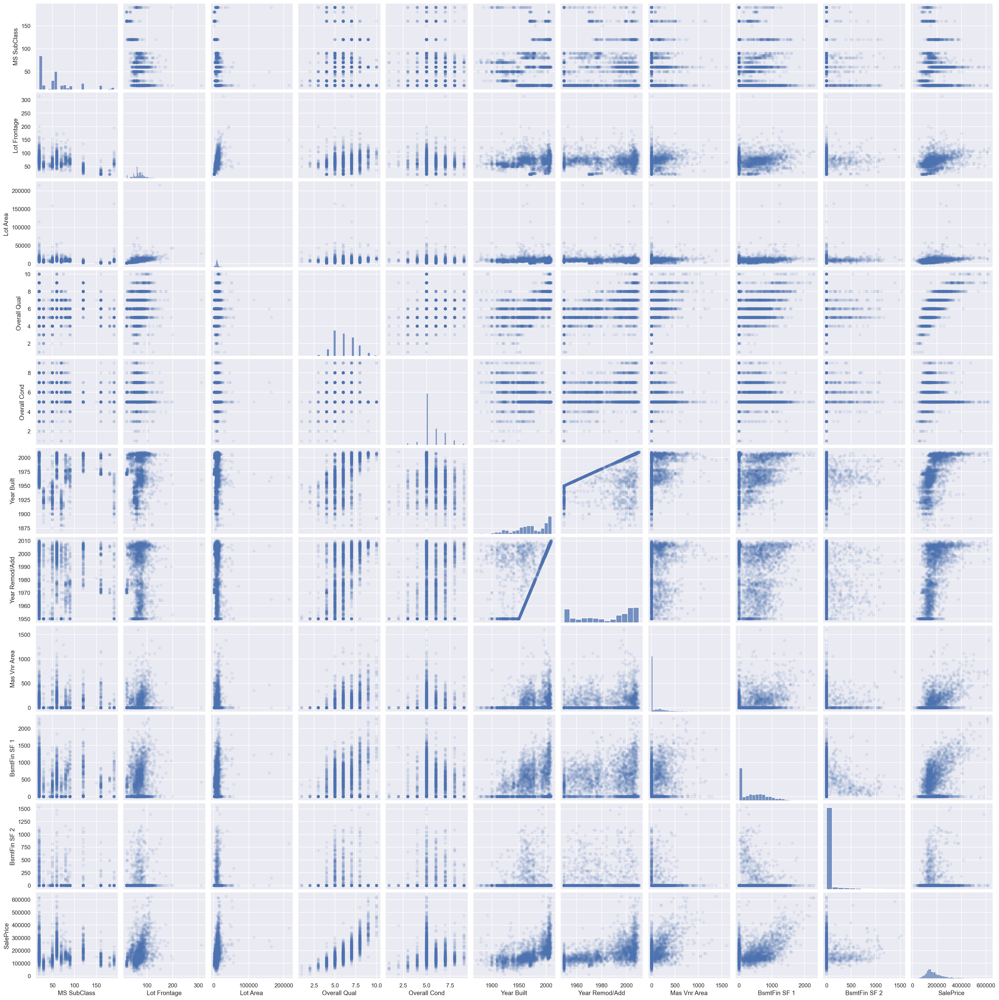

In [14]:
# This line of code was also taken from the lab demo
sns.pairplot(smaller_df, plot_kws=dict(alpha=.1, edgecolor='none'))

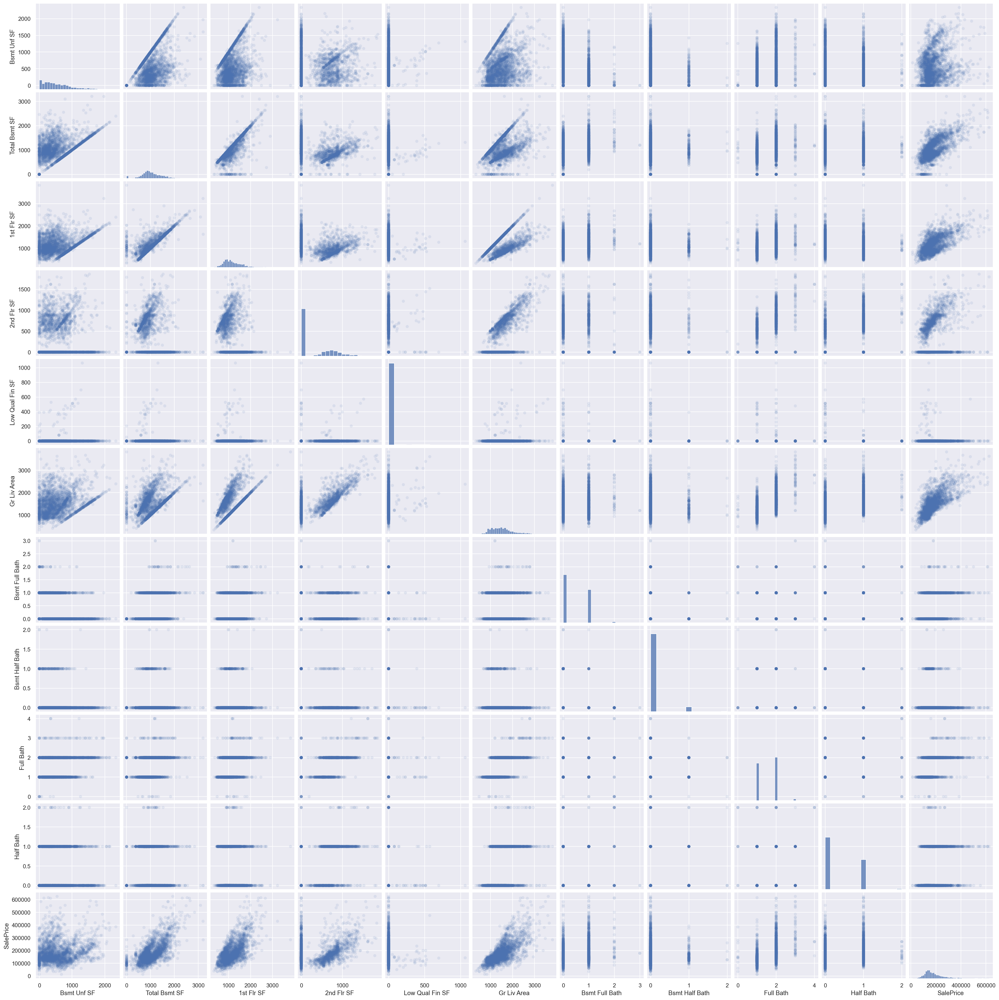

In [15]:
sns.pairplot(smaller_df2, plot_kws=dict(alpha=.1, edgecolor='none'))

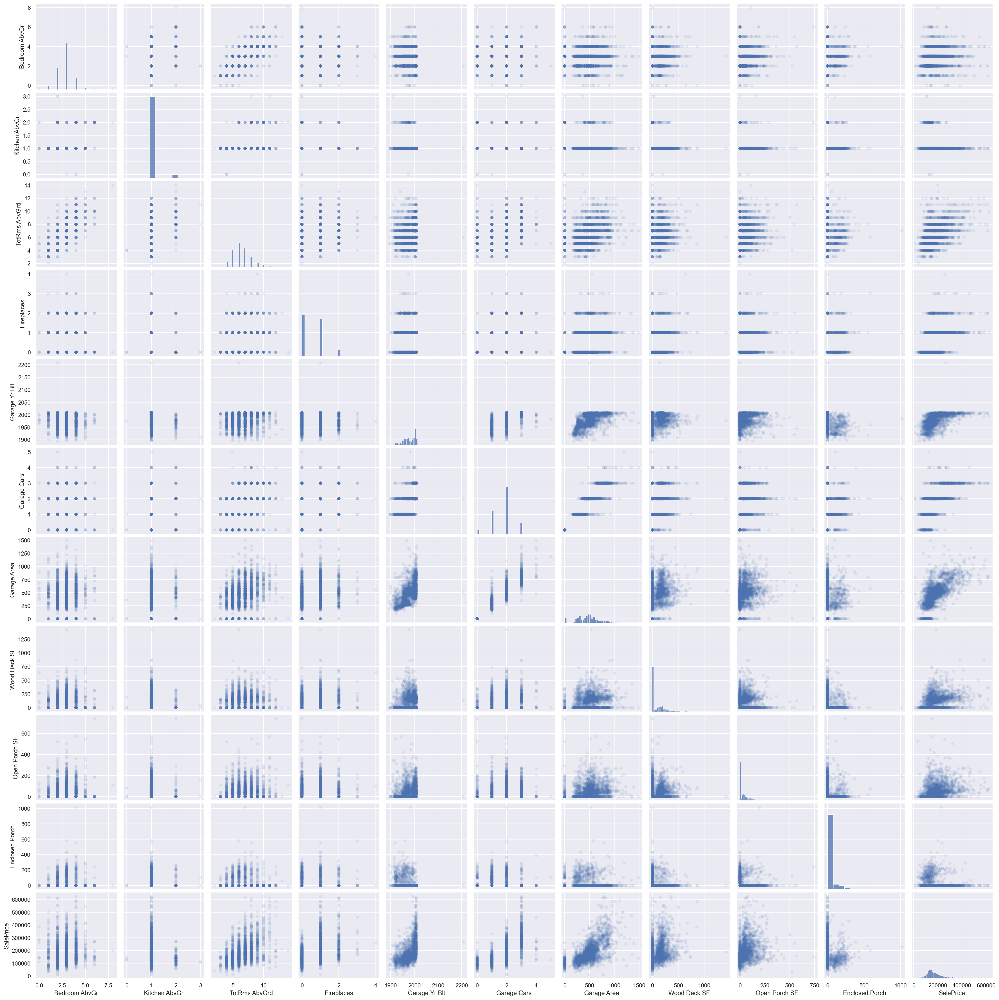

In [16]:
sns.pairplot(smaller_df3, plot_kws=dict(alpha=.1, edgecolor='none'))

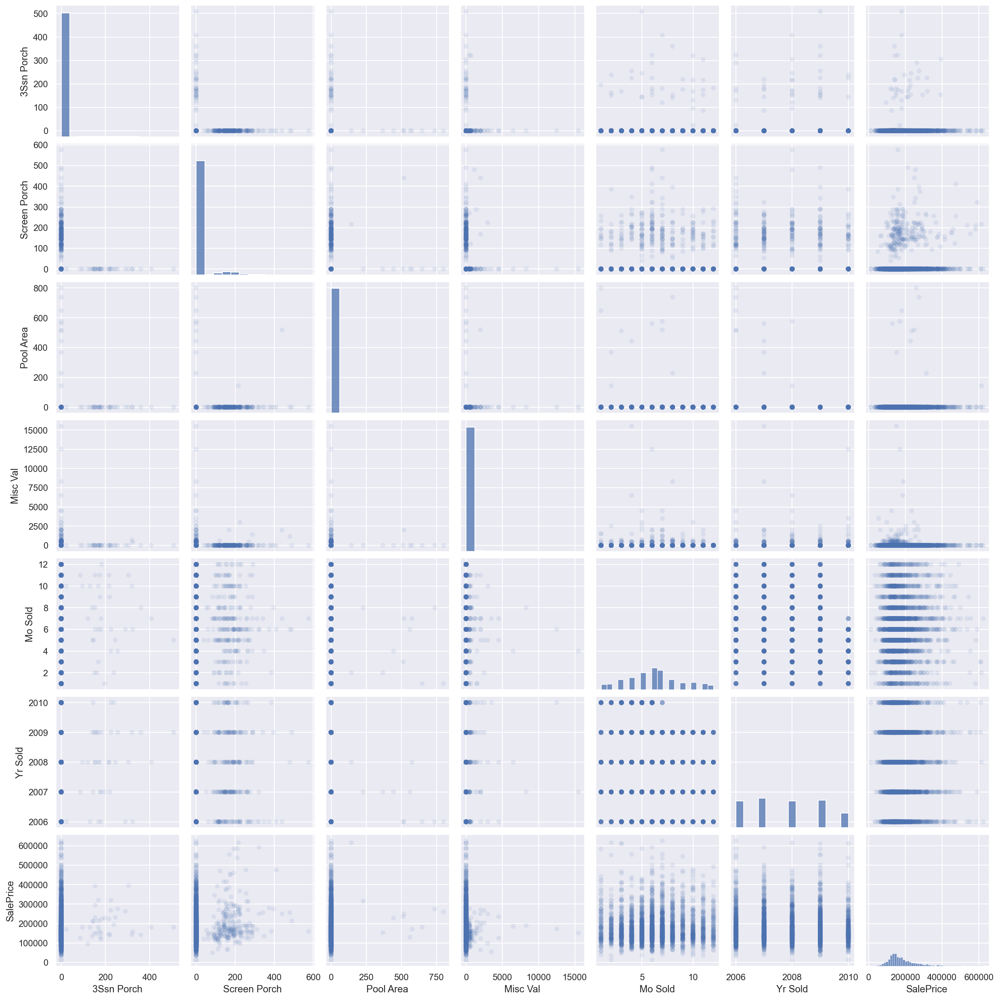

In [17]:
sns.pairplot(smaller_df4, plot_kws=dict(alpha=.1, edgecolor='none'))

## 4. Pair plot: selected features 

Let's now select a subset of features for a (future) multiple regression model. This selection is based on the selection of features for the multiple regression model developed by the data set author (De Cock, 2011, p. 10). The difference is that the group below doesn't include a categorical variable (and only numerical variables instead).

In [6]:
# Lot Area: int64
# Total Bsmt SF: float64
# Gr Liv Area: in64
# Garage cars: float64
# Fireplaces: int64
# SalePrice: int64
subset_df= df.loc[:,['Lot Area', 'Total Bsmt SF', 'Gr Liv Area', 'Garage Cars', 'Fireplaces', 
                      'SalePrice']]

#### Quick inspection of the selected features 

In [7]:
subset_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2925 entries, 0 to 2929
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Lot Area       2925 non-null   int64  
 1   Total Bsmt SF  2924 non-null   float64
 2   Gr Liv Area    2925 non-null   int64  
 3   Garage Cars    2924 non-null   float64
 4   Fireplaces     2925 non-null   int64  
 5   SalePrice      2925 non-null   int64  
dtypes: float64(2), int64(4)
memory usage: 160.0 KB


Above, we can also see that there aren't a lot of missing values! (only 1 for 'Total Bsmt SF' and, likewise, only 1 for 'Garage cars'!)

#### Quick sanity check 

In [8]:
print("Number of observations (subset): ", subset_df.shape[0])
print("Number of columns of the DataFrame (subset): ", subset_df.shape[1])

Number of observations (subset):  2925
Number of columns of the DataFrame (subset):  6


#### Pair plot 

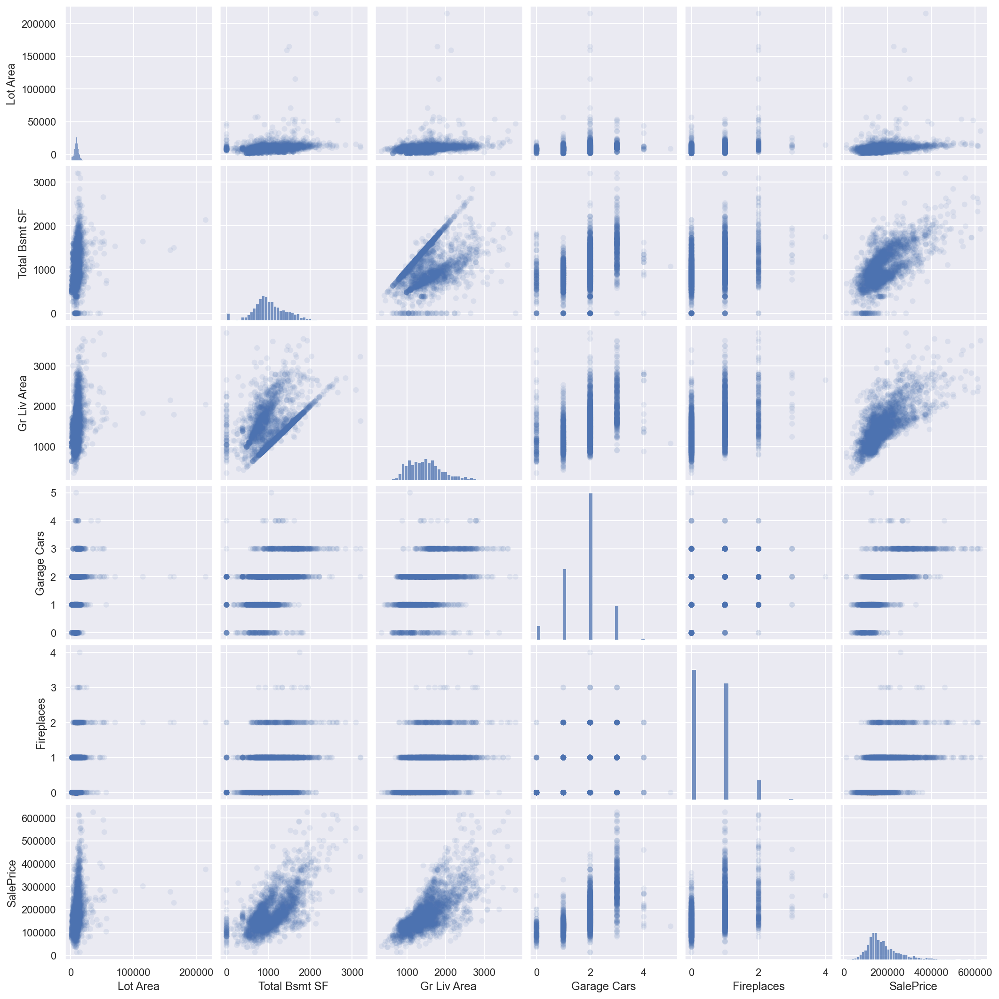

In [21]:
sns.pairplot(subset_df, plot_kws=dict(alpha=.1, edgecolor='none'))

## 5. Box plots: selected features 

<AxesSubplot:>

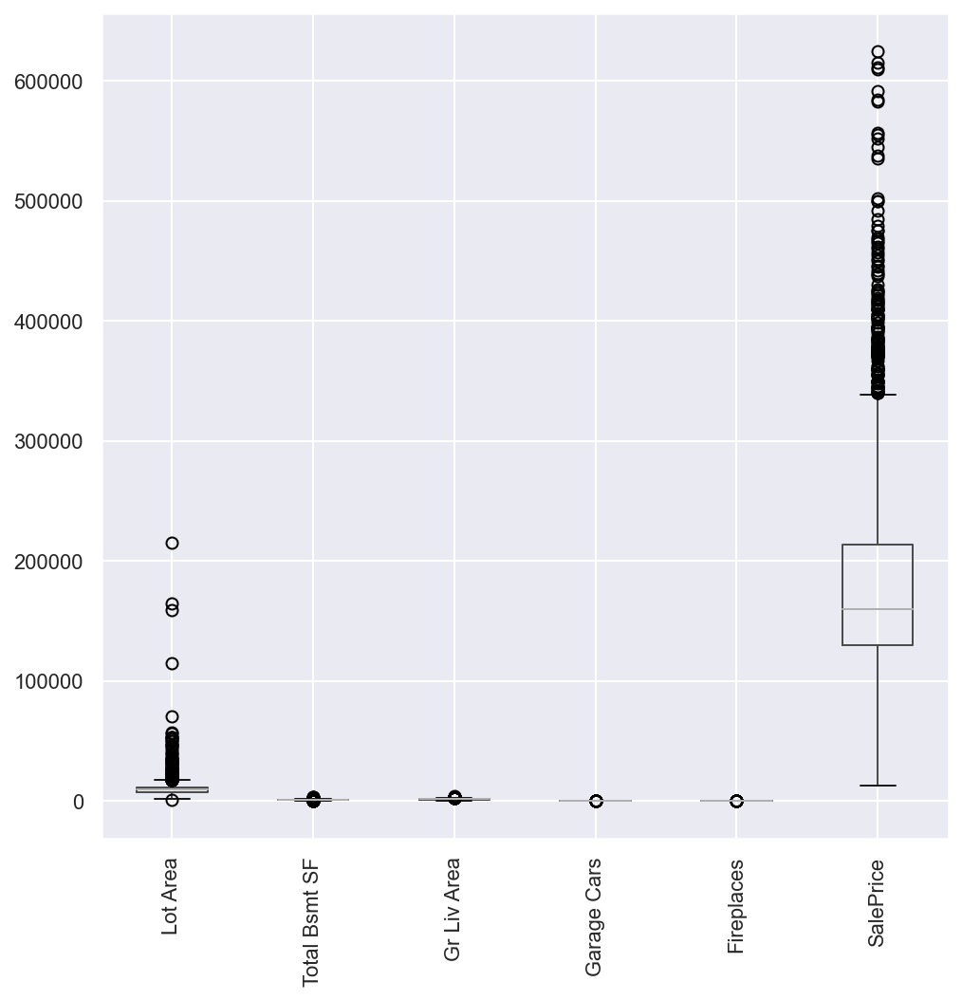

In [22]:
# let's take a look at the boxplot of our selected variables
subset_df.boxplot(figsize=(8,8),rot=90)

## 6. Relevant statistics: selected features 

In [9]:
# Let's consider some relevant statistics (prior to data transformation) that will be helpful for future steps
subset_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Lot Area,2925.0,10103.583590,7781.999124,1300.0,7438.00,9428.0,11515.00,215245.0
Total Bsmt SF,2924.0,1046.852257,421.109533,0.0,792.75,989.5,1299.25,3206.0
Gr Liv Area,2925.0,1493.978803,486.273646,334.0,1126.00,1441.0,1740.00,3820.0
Garage Cars,2924.0,1.765048,0.759834,0.0,1.00,2.0,2.00,5.0
Fireplaces,2925.0,0.596923,0.645349,0.0,0.00,1.0,1.00,4.0
SalePrice,2925.0,180411.574701,78554.857286,12789.0,129500.00,160000.0,213500.00,625000.0


## 7. Missing values: selected features 

Since there is only one missing value for 'Garage Cars' and 'Total Bsmt SF' as well, let's follow the approach of the lab demo and fill these missing values with 0s. Also, according to the statistics we previously obtained, 0 is the minimum value for both of the previous variables.

#### Fill missing values with a '0' 

In [10]:
subset_df = subset_df.fillna(0)

#### Gather new summary statistics 

In [11]:
subset_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Lot Area,2925.0,10103.583590,7781.999124,1300.0,7438.0,9428.0,11515.0,215245.0
Total Bsmt SF,2925.0,1046.494359,421.482215,0.0,792.0,989.0,1299.0,3206.0
Gr Liv Area,2925.0,1493.978803,486.273646,334.0,1126.0,1441.0,1740.0,3820.0
Garage Cars,2925.0,1.764444,0.760405,0.0,1.0,2.0,2.0,5.0
Fireplaces,2925.0,0.596923,0.645349,0.0,0.0,1.0,1.0,4.0
SalePrice,2925.0,180411.574701,78554.857286,12789.0,129500.0,160000.0,213500.0,625000.0


In [28]:
# Let's also save it for later
subset_df.describe().T.to_excel("./statistics/subset_statistics_before_log_with_zero.xlsx")

## 8. Log transformation: selected features

Based on the pair plot, the distributions of the variables we've selected are skewed. Let's try using the log transformation (log(1+x)) used in the demo to improve the observed behavior. 

Reference: https://numpy.org/doc/stable/reference/generated/numpy.log1p.html

#### Calculate skewness 

In [44]:
skewed_variables = subset_df[subset_df.columns.tolist()].skew()
#skewed_variables is a Pandas Series; the next line of code was adapted from the demo
skewed_variables_frame = skewed_variables.sort_values(ascending=False).to_frame().rename(columns={0:'Skew'}) 
skewed_variables_frame

,Skew
Lot Area,13.200004
SalePrice,1.591072
Gr Liv Area,0.878879
Fireplaces,0.732312
Total Bsmt SF,0.395191
Garage Cars,-0.221062


#### Apply the log transformation (one by one) and visually observe the changes 

The following code was adapted from the code of the lab demo.

In [30]:
# Let's create a function for visualizing the effect of the transformation
def apply_transformation(variable):
    # @variable: type string
    # Create 2 subplots and a figure (matplotlib)
    fig, (ax_before, ax_after) = plt.subplots(1, 2, figsize=(10, 5))

    # Create a histogram of the "ax_before" subplot
    subset_df[variable].hist(ax=ax_before)

    # Apply the log transformation to the variable (log(1+x))
    subset_df[variable].apply(np.log1p).hist(ax=ax_after)

    # Formatting the subplots
    ax_before.set(title='Before the np.log1p transformation', ylabel='Frequency', xlabel='Value')
    ax_after.set(title='After the np.log1p transformation', ylabel='Frequency', xlabel='Value')
    fig.suptitle('Field "{}"'.format(variable));

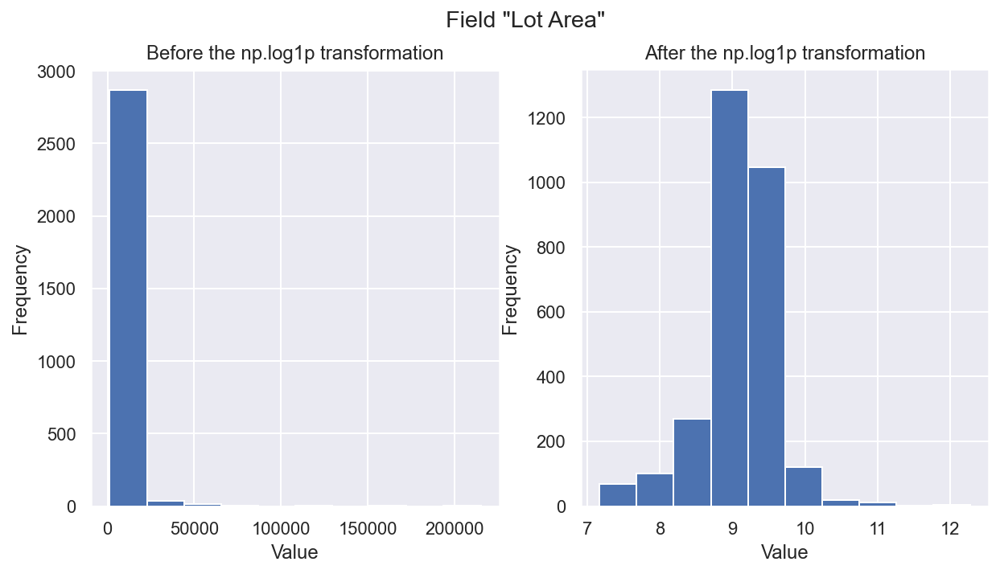

In [37]:
# Now let's call the function with the variables we want to study
apply_transformation("Lot Area")

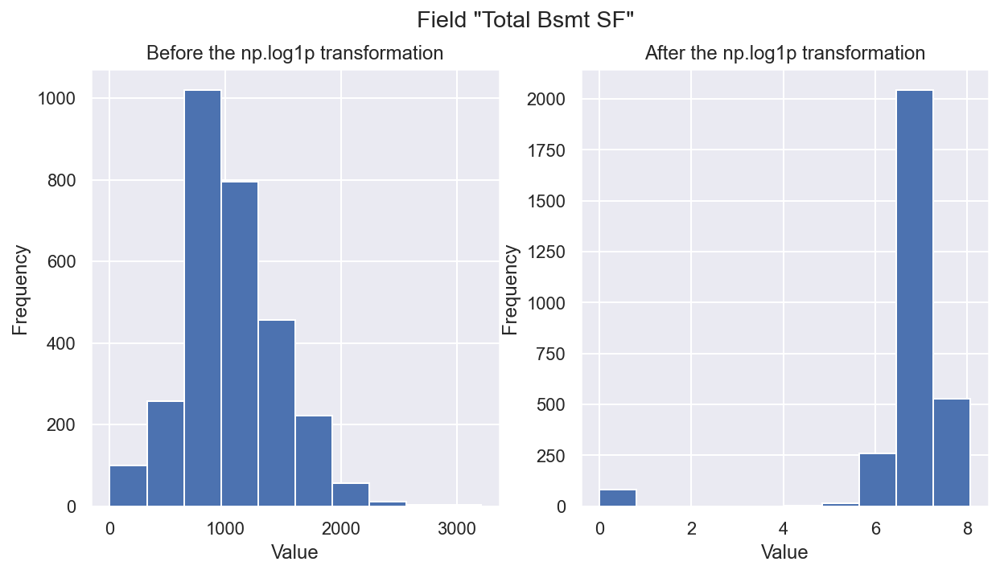

In [38]:
apply_transformation("Total Bsmt SF")

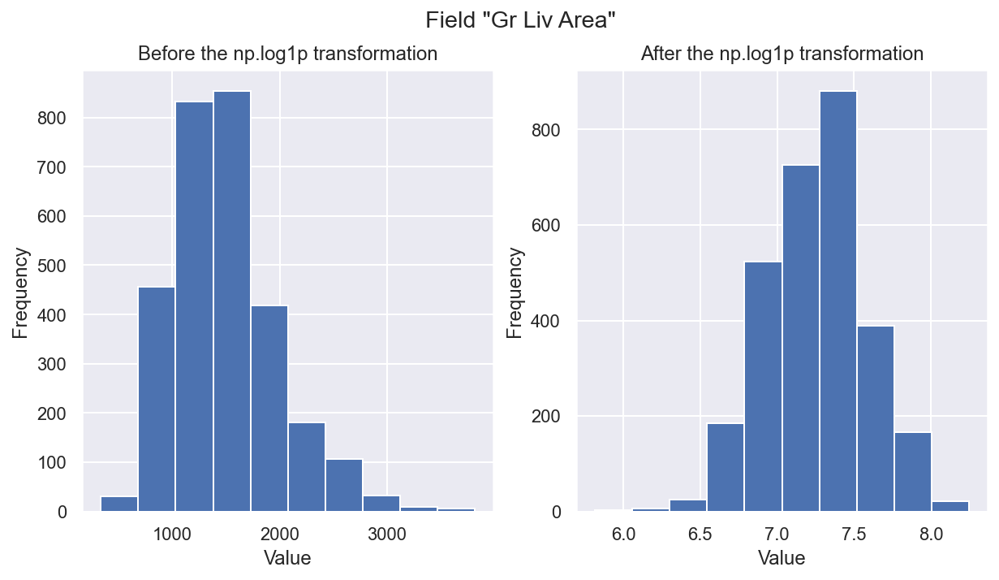

In [33]:
apply_transformation("Gr Liv Area")

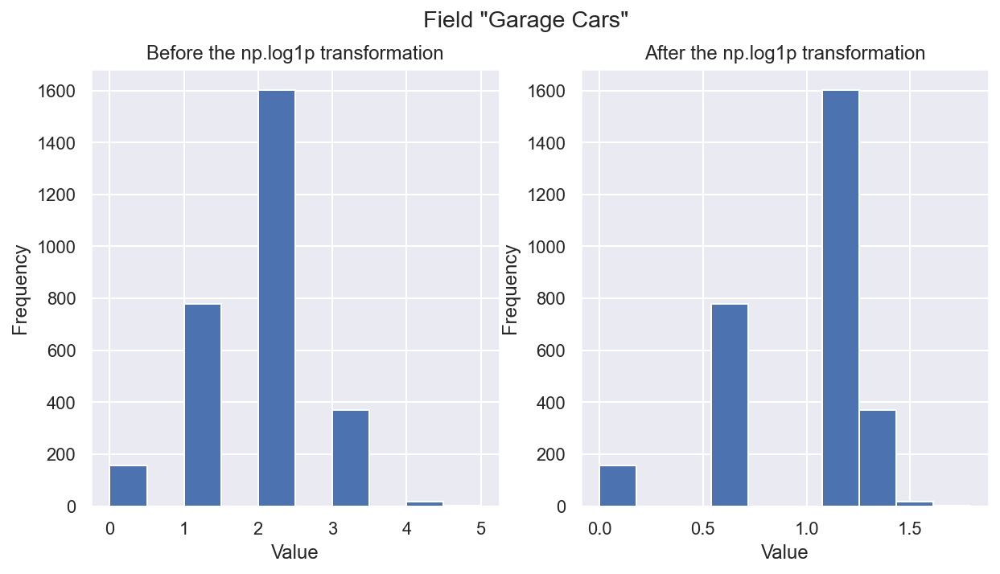

In [34]:
apply_transformation("Garage Cars")

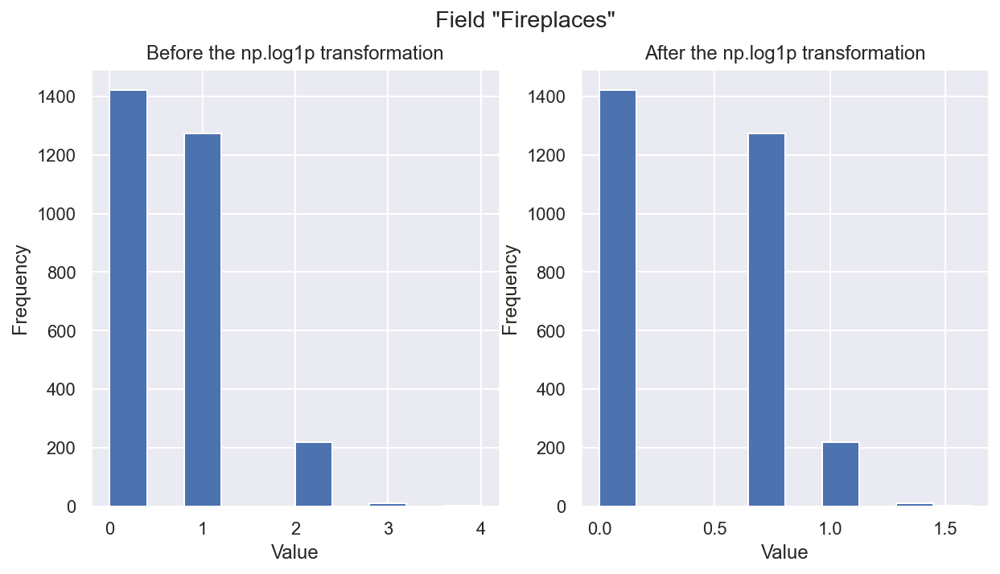

In [35]:
apply_transformation("Fireplaces")

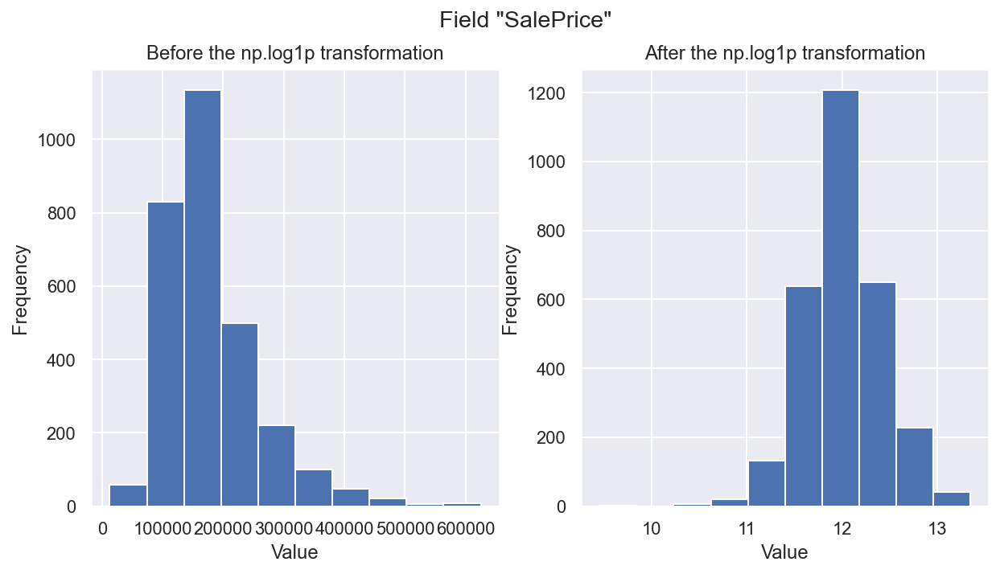

In [36]:
apply_transformation("SalePrice")

#### Create a copy of our subset of variables 

In [39]:
subset_df_copy = subset_df.copy()

#### Recalculate skewness after applying the log(1+x) transformation 

In [40]:
subset_df = subset_df.apply(np.log1p)

In [41]:
skewed_variables_log = subset_df[subset_df.columns.tolist()].skew()
skewed_variables_frame_log = skewed_variables_log.sort_values(ascending=False).to_frame().rename(columns={0:'Skew'}) 
skewed_variables_frame_log

,Skew
Fireplaces,0.235802
SalePrice,-0.041927
Gr Liv Area,-0.059228
Lot Area,-0.534108
Garage Cars,-1.279444
Total Bsmt SF,-4.956425


Note that for 'Garage Cars' and 'Total Bsmt SF', the absolute value of the skewness increased after applying the transformation. This can also be seen in the previous histograms. Therefore, let's not apply the transformation to these variables.

#### Applying the log transformation to a subset of our selected variables

In [42]:
# Let's make a list of the variables we'll transform
selected_variables = ["Fireplaces", "SalePrice", "Gr Liv Area", "Lot Area"]

In [43]:
# Let's retrieve the copy of our data
subset_df = subset_df_copy

In [45]:
# And now let's join both subsets
subset0 = subset_df[selected_variables].apply(np.log1p)
subset1 = subset_df[['Garage Cars','Total Bsmt SF']]
new_df = subset0.join(subset1)
new_df.describe()

,Fireplaces,SalePrice,Gr Liv Area,Lot Area,Garage Cars,Total Bsmt SF
count,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000,2925.000000
mean,0.389310,12.019887,7.258784,9.090148,1.764444,1046.494359
std,0.394534,0.406013,0.320753,0.508309,0.760405,421.482215
min,0.000000,9.456419,5.814131,7.170888,0.000000,0.000000
25%,0.000000,11.771444,7.027315,8.914492,1.000000,792.000000
50%,0.693147,11.982935,7.273786,9.151545,2.000000,989.000000
75%,0.693147,12.271397,7.462215,9.351493,2.000000,1299.000000
max,1.609438,13.345509,8.248267,12.279537,5.000000,3206.000000


#### Recalculate skewness 

In [46]:
# now, let's obtain the skewness values again
skewed_variables_log = new_df[new_df.columns.tolist()].skew()
skewed_variables_frame_log = skewed_variables_log.sort_values(ascending=False).to_frame().rename(columns={0:'Skew'}) 
skewed_variables_frame_log

,Skew
Total Bsmt SF,0.395191
Fireplaces,0.235802
SalePrice,-0.041927
Gr Liv Area,-0.059228
Garage Cars,-0.221062
Lot Area,-0.534108


In [47]:
# Let's also save these results
skewed_variables_frame_log.to_excel("./statistics/subset_skewness_after_log_with_zero.xlsx")

#### Reset the index 

In [48]:
new_df = new_df.reset_index(drop=True)
new_df.shape

(2925, 6)

In [49]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2925 entries, 0 to 2924
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Fireplaces     2925 non-null   float64
 1   SalePrice      2925 non-null   float64
 2   Gr Liv Area    2925 non-null   float64
 3   Lot Area       2925 non-null   float64
 4   Garage Cars    2925 non-null   float64
 5   Total Bsmt SF  2925 non-null   float64
dtypes: float64(6)
memory usage: 137.2 KB


## 9. Pair plot: selected features (after log)

Let's now take a look at our new plots!

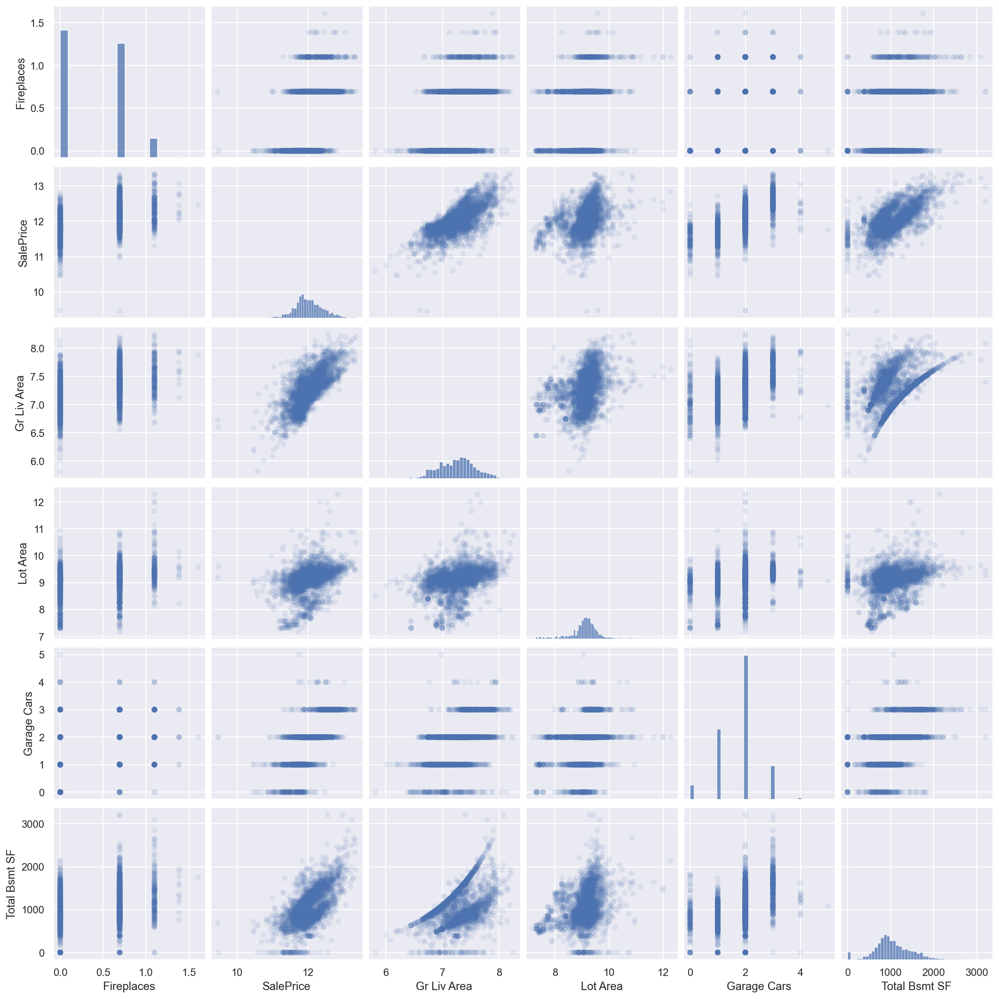

In [50]:
sns.pairplot(new_df, plot_kws=dict(alpha=.1, edgecolor='none'))

## 10. Boxplots: selected features (after log) 

<AxesSubplot:>

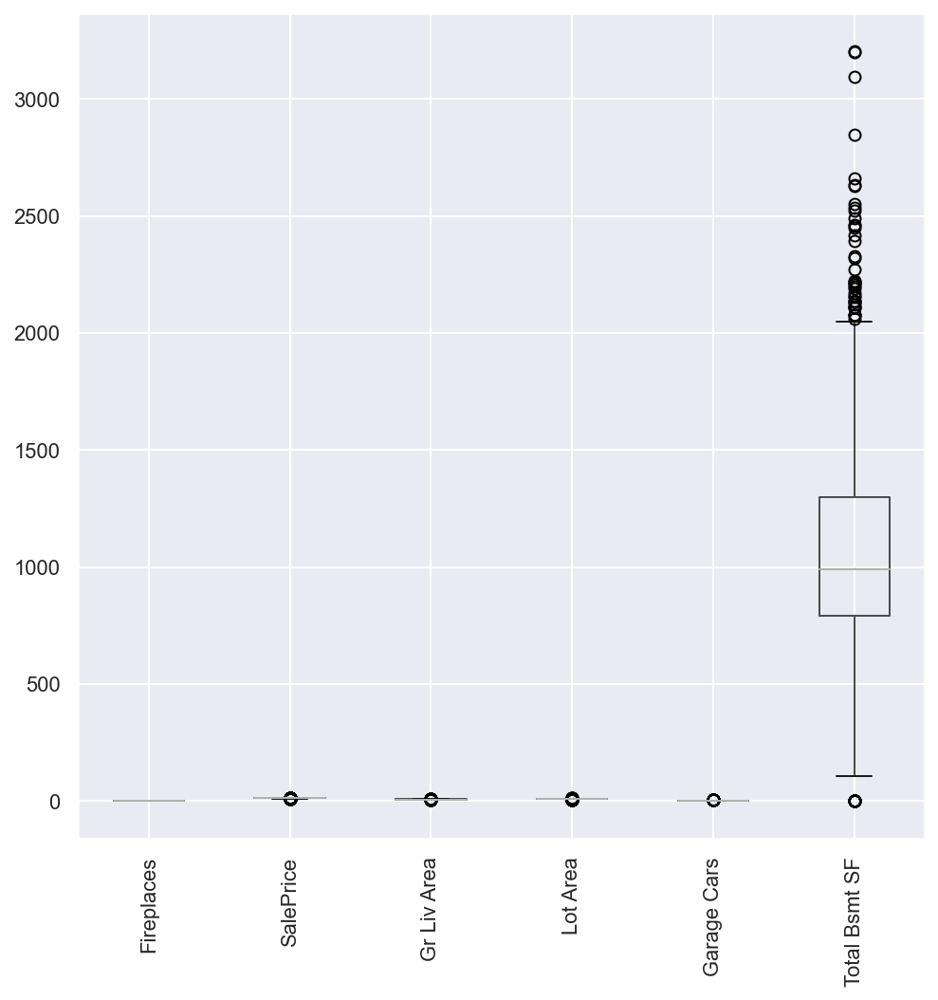

In [51]:
# let's also take a look at the boxplot of our selected variables now after applying the log transformation
new_df.boxplot(figsize=(8,8),rot=90)

#### Exploring the features 

<AxesSubplot:>

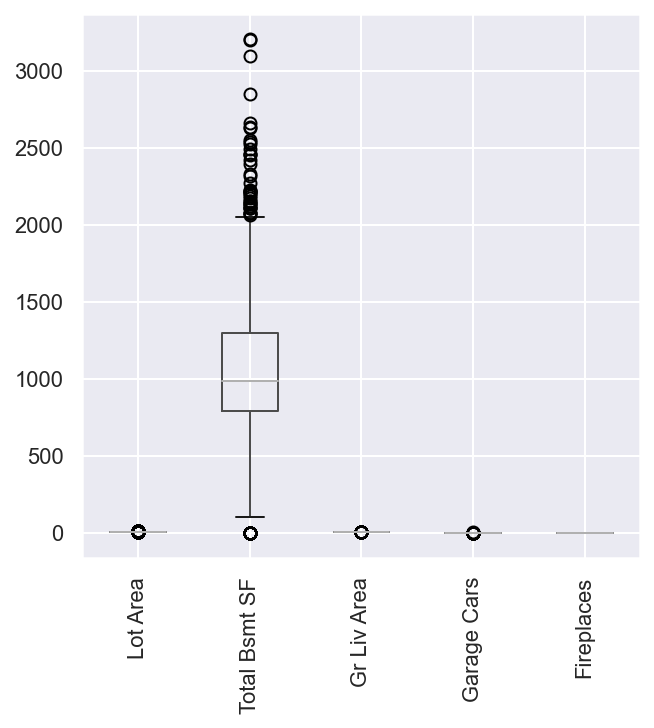

In [57]:
# Let's also zoom in to look at the features more closely
new_df[['Lot Area', 'Total Bsmt SF', 'Gr Liv Area', 'Garage Cars', 'Fireplaces']].boxplot(figsize=(5,5),rot=90)

<AxesSubplot:>

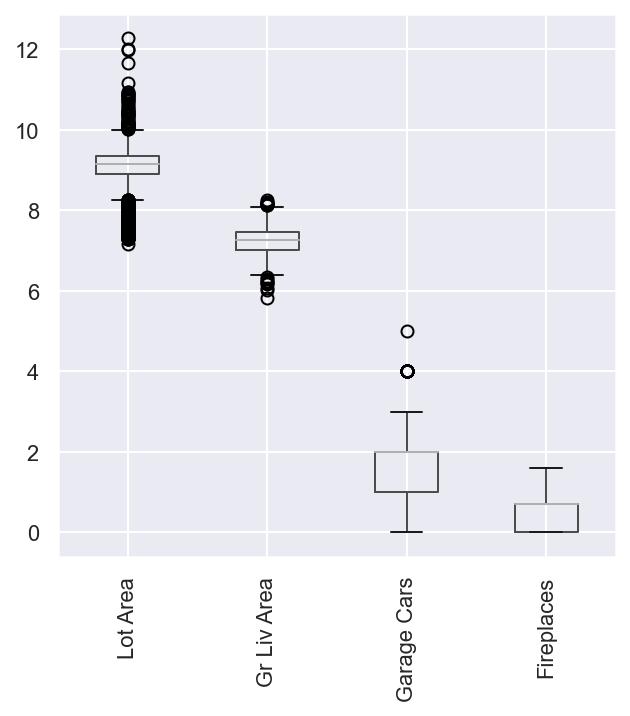

In [55]:
# Let's also zoom in to look at the features more closely
new_df[['Lot Area', 'Gr Liv Area', 'Garage Cars', 'Fireplaces']].boxplot(figsize=(5,5),rot=90)

## 11. Scatter plots: selected features and the target (after log)

#### Define a function 

In [71]:
def plot_scatterplot(x_var, y_var):
    fig, ax = plt.subplots()
    new_df.plot(kind="scatter", x=x_var, y=y_var, ax=ax, figsize=(4,4));

#### Target and the features 

Let's take a closer look at some of the scatter plots between the target and the features!

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


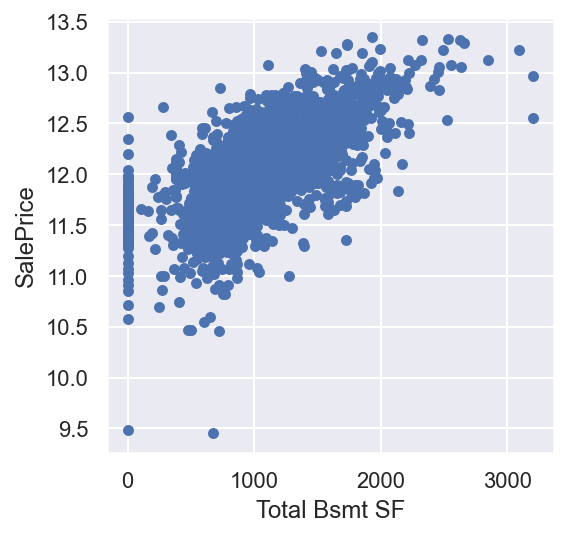

In [72]:
plot_scatterplot("Total Bsmt SF","SalePrice")

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


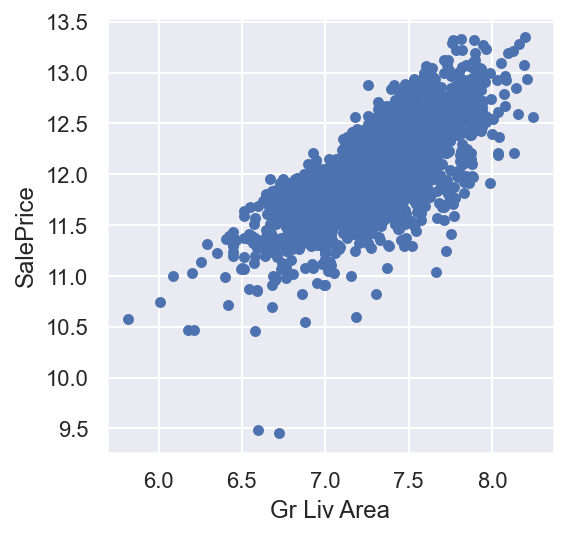

In [73]:
plot_scatterplot("Gr Liv Area","SalePrice")

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


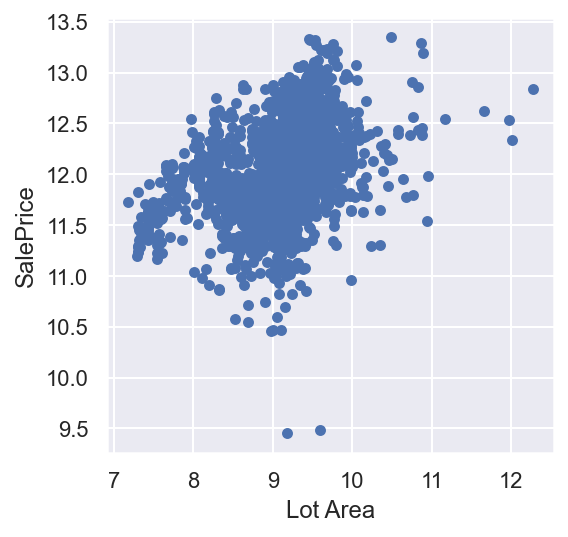

In [74]:
plot_scatterplot("Lot Area","SalePrice")

##  12. Save the data set + statistics: selected features (after log)

In [75]:
new_df.to_csv("./data/selected_variables_clean.csv",index=False)

In [79]:
new_df.describe().T.to_excel("./statistics/subset_statistics_after_log_with_zero.xlsx")

#### Load back the data set 

In [76]:
new_df_read = pd.read_csv("./data/selected_variables_clean.csv")

#### Sanity checks (general information and skewness) 

In [77]:
new_df_read.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2925 entries, 0 to 2924
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Fireplaces     2925 non-null   float64
 1   SalePrice      2925 non-null   float64
 2   Gr Liv Area    2925 non-null   float64
 3   Lot Area       2925 non-null   float64
 4   Garage Cars    2925 non-null   float64
 5   Total Bsmt SF  2925 non-null   float64
dtypes: float64(6)
memory usage: 137.2 KB


In [78]:
skewed_variables_log = new_df_read[new_df_read.columns.tolist()].skew()
skewed_variables_frame_log = skewed_variables_log.sort_values(ascending=False).to_frame().rename(columns={0:'Skew'}) 
skewed_variables_frame_log

,Skew
Total Bsmt SF,0.395191
Fireplaces,0.235802
SalePrice,-0.041927
Gr Liv Area,-0.059228
Garage Cars,-0.221062
Lot Area,-0.534108


## 13. Hypothesis testing - Kolmogorov Smirnov 

Let's perform a hypothesis test, specifically the One Sample Kolmogorov-Smirnov test. Also, we'll need a continuous variable for this test. We can choose, for example, 'Total Bsmt SF' (total square feet of the basements).

#### Copy of our data 

In [6]:
df_hypothesis = data_test[['Total Bsmt SF']] # let's retrieve the continuous variable from the copy we made previously
df_hypothesis.describe().T

,count,mean,std,min,25%,50%,75%,max
Total Bsmt SF,2924.0,1046.852257,421.109533,0.0,792.75,989.5,1299.25,3206.0


#### Eliminating null values

In [7]:
df_null = df_hypothesis.isnull()
row_with_NaN = df_null.any(axis=1)
df_hypothesis[row_with_NaN]
# df_hypothesis.iloc[1341] # Row with index = 1341 has the null value

,Total Bsmt SF
1341,NaN


In [8]:
# Next, let's drop the null value based on its index
df_hypothesis_new = df_hypothesis.drop(index=1341, inplace=False)
df_hypothesis_new.describe().T

,count,mean,std,min,25%,50%,75%,max
Total Bsmt SF,2924.0,1046.852257,421.109533,0.0,792.75,989.5,1299.25,3206.0


#### Sanity check (no null values)

In [9]:
df_null_new = df_hypothesis_new.isnull()
row_with_NaN_new = df_null_new.any(axis=1)
df_hypothesis_new[row_with_NaN_new]

,Total Bsmt SF


#### Sort values 

In [10]:
# Order 
df_hypothesis_new_series = df_hypothesis_new['Total Bsmt SF'].sort_values()
# df_hypothesis_sorted = df_hypothesis_new.sort_values(by=['Total Bsmt SF']) # We can do the same with the df
# df_hypothesis_sorted.reset_index(inplace=True) # We can also reset the index of the df
df_hypothesis_new_series.describe().T

count    2924.000000
mean     1046.852257
std       421.109533
min         0.000000
25%       792.750000
50%       989.500000
75%      1299.250000
max      3206.000000
Name: Total Bsmt SF, dtype: float64

#### Convert data to numpy array 

In [12]:
#np.set_printoptions(formatter={'float': lambda x: "{0:0.5f}".format(x)}) # We can optionally set the precision 
hypothesis_sorted_array = df_hypothesis_new_series.to_numpy(dtype="float64",copy=True)
hypothesis_sorted_array[1461] # Check the median

989.0

#### Perform the KS hypothesis test 

Let's set a significance level of 0.05. The null hypothesis H0 states that the data fits the theoretical distribution (a normal distribution in this case) whereas the alternative hypothesis Ha states that it doesn't.

In [17]:
from scipy.stats import kstest
kstest(hypothesis_sorted_array, cdf='norm') # standard normal distribution

KstestResult(statistic=0.9729822161422709, pvalue=0.0)

In [18]:
kstest(hypothesis_sorted_array, cdf='norm',args=(1046.852257,421.109533)) # normal distribution with sample parameters (unbiased)

KstestResult(statistic=0.06386622788917229, pvalue=8.213032219133894e-11)

In [28]:
kstest(hypothesis_sorted_array, cdf='norm',args=(1046.852257,421.109533), mode="exact")

KstestResult(statistic=0.06386622788917229, pvalue=8.213032219133894e-11)

In [29]:
kstest(hypothesis_sorted_array, cdf='norm',args=(1046.852257,421.109533), mode="asym")

KstestResult(statistic=0.06386622788917229, pvalue=8.213032219133894e-11)

In [16]:
# On the other hand, in this example, we can accept H0
kstest(np.random.normal(0,1,3000),'norm')

KstestResult(statistic=0.008507634512061601, pvalue=0.9804173443680081)

In [22]:
# We can verify the distribution was configured correctly with the code below
# Reference: https://docs.scipy.org/doc/scipy/reference/tutorial/stats.html
from scipy.stats import norm 
#norm.stats(loc=1046.852257, scale=421.109533)

In [26]:
norm.mean(loc=1046.852257, scale=421.109533)

1046.852257

In [27]:
norm.std(loc=1046.852257, scale=421.109533)

421.109533